### Loading Packages

In [1]:
import pandas as pd
from scipy.stats import spearmanr
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import gc
import matplotlib.lines as lines
current_working_directory = os.getcwd()
SAVEDIR = os.path.dirname(current_working_directory)

In [2]:
def calculate_rmse(true_labels, pred_labels):
    true_labels = np.array(true_labels)
    pred_labels = np.array(pred_labels)
    mse = np.mean((true_labels - pred_labels) ** 2)  # 
    rmse = np.sqrt(mse)  # 
    return rmse

In [3]:
def exact_accuracy(true_labels, pred_labels):
    success_count = 0
    for true, pred in zip(true_labels, pred_labels):
        if true == pred:
            success_count += 1
    accuracy = success_count / len(true_labels)
    return accuracy

In [4]:
def adjacency_accuracy(true_labels, pred_labels):
    success_count = 0
    for true, pred in zip(true_labels, pred_labels):
        if abs(true - pred) <= 1:
            success_count += 1
    accuracy = success_count / len(true_labels)
    return accuracy

### CEFR-SP_Part, DP-Planner + Semantic CoT

In [5]:
df_agent_expert = pd.read_csv("LLMGeneration/CEFR-SP/en_few-shot_48.csv")
label_all = [1 for _ in range(len(df_agent_expert))] + [2 for _ in range(len(df_agent_expert))] + [3 for _ in range(len(df_agent_expert))] 
pred_all = df_agent_expert["pred_1"].tolist() + df_agent_expert["pred_2"].tolist() + df_agent_expert["pred_3"].tolist()
print("RMSE: ", calculate_rmse(label_all, pred_all))
print("AdjAcc: ", round(adjacency_accuracy(label_all, pred_all)*100, 2))
print("ExAcc: ", round(exact_accuracy(label_all, pred_all)*100, 2))
correlation, p_value = spearmanr(label_all, pred_all)
print("Cor: ", correlation)

RMSE:  1.3069925120037664
AdjAcc:  74.23
ExAcc:  27.43
Cor:  0.4575617606782496


In [6]:
cefrmap = {
    1: "A1", 2: "A2", 3: "B1", 4: "B2", 5: "C1", 6: "C2"
}
rmse_matrix = []
for source in [4, 5, 6]:
    df_ = df_agent_expert.loc[df_agent_expert["Rating"] == source]
    tmplist = []
    for target in [1, 2, 3]:
        pred_ = df_[f"pred_{target}"].tolist()
        label_ = [target for _ in range(len(pred_))]
        print(cefrmap[source], cefrmap[target], round(calculate_rmse(label_, pred_), 2))
        tmplist.append(round(calculate_rmse(label_, pred_), 2))
    rmse_matrix.append(tmplist)
print(np.array(rmse_matrix))

B2 A1 1.61
B2 A2 1.07
B2 B1 0.59
C1 A1 1.66
C1 A2 1.36
C1 B1 0.91
C2 A1 1.71
C2 A2 1.51
C2 B1 1.06
[[1.61 1.07 0.59]
 [1.66 1.36 0.91]
 [1.71 1.51 1.06]]


### CEFR-SP_Partial RMSE Heatmap Visualization

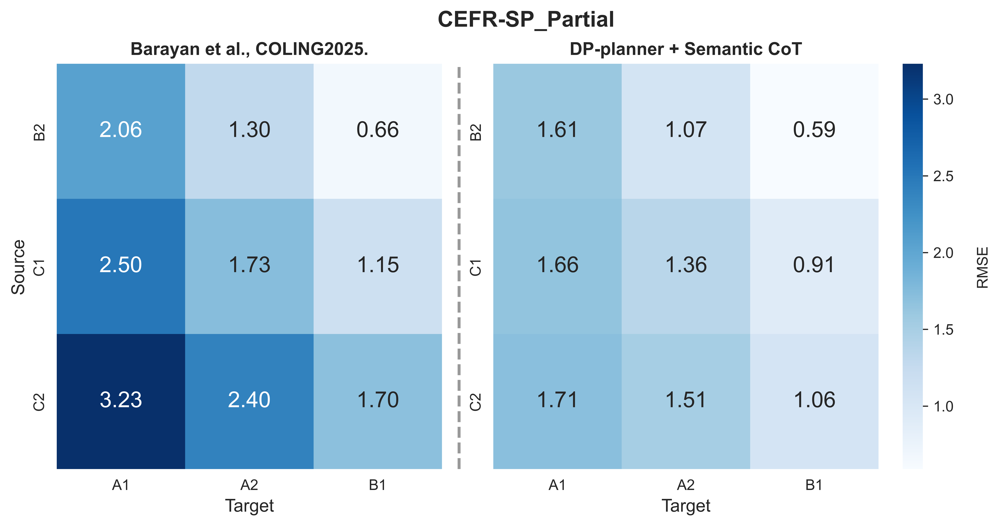

In [7]:
baseline = np.array([[2.06, 1.30, 0.66],
                   [2.50, 1.73, 1.15],
                   [3.23, 2.40, 1.70]])

agent_expert = np.array(rmse_matrix)


vmin = min(baseline.min(), agent_expert.min())
vmax = max(baseline.max(), agent_expert.max())

fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=1000, gridspec_kw={'width_ratios': [1, 1.25]})

x_labels = ['A1', 'A2', 'B1']
y_labels = ['B2', 'C1', 'C2']

cmap = "Blues"
sns.heatmap(baseline, annot=True, ax=axes[0], cbar=False, cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
axes[0].set_title('Barayan et al., COLING2025.', fontsize = 12, fontweight='bold')
axes[0].set_xlabel('Target', fontsize = 12)
axes[0].set_ylabel('Source', fontsize = 12)

heatmap = sns.heatmap(agent_expert, annot=True, ax=axes[1], cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
axes[1].set_title('DP-planner + Semantic CoT', fontsize = 12, fontweight='bold')
axes[1].set_xlabel('Target', fontsize = 12)
# axes[1].set_yticks([])
# axes[1].set_yticklabels([])
# axes[1].set_ylabel('Source', fontsize = 12)

cbar = heatmap.collections[0].colorbar

cbar.set_label('RMSE', rotation=90, labelpad=15)


fig.suptitle('CEFR-SP_Partial', fontsize=15, fontweight='bold')

plt.subplots_adjust(wspace=10)  # 


plt.tight_layout()
plt.subplots_adjust(top=0.88)

ax0_pos = axes[0].get_position()
ax1_pos = axes[1].get_position()
x_line = (ax0_pos.x1 + ax1_pos.x0) / 2  
y_start = ax0_pos.y0
y_end = ax0_pos.y1

line = lines.Line2D([x_line-0.008, x_line-0.008], [y_start, y_end], transform=fig.transFigure, color='#999999', linewidth=2.0, linestyle="--")
fig.add_artist(line)

plt.savefig(os.path.join(SAVEDIR, f"img/CEFR-SP/CEFR-SP_Partial_dp-cot_rmse.jpg"), dpi = 1000, bbox_inches='tight')
plt.show()
plt.close()

### CEFR-SP_Partial Adjacency and Exact Accuracy Heatmap Visualization

In [ ]:
cefrsp_matrix_adjacc = dict()
cefrsp_matrix_exaacc = dict()

for expId in ["29", "48"]:  # 29 -> baseline; 48 -> DP-planner + Semantic CoT
    df_agent_expert = pd.read_csv(f"LLMGeneration/CEFR-SP/en_few-shot_{expId}.csv")
    label_all = [1 for _ in range(len(df_agent_expert))] + [2 for _ in range(len(df_agent_expert))] + [3 for _ in range(len(df_agent_expert))] 
    pred_all = df_agent_expert["pred_1"].tolist() + df_agent_expert["pred_2"].tolist() + df_agent_expert["pred_3"].tolist()
    correlation, p_value = spearmanr(label_all, pred_all)
    autometric_dict = {
        "Cor: ": round(correlation, 2),
        "p_value": round(p_value, 5),
        "AdjAcc": round(adjacency_accuracy(label_all, pred_all)*100, 2),
        "ExAcc": round(exact_accuracy(label_all, pred_all)*100, 2),
        "RMSE": round(calculate_rmse(label_all, pred_all), 2),
    }
    print(expId, autometric_dict)
    rmse_matrix, adjacc_matrix, exacc_matrix = [], [], []
    for source in [4, 5, 6]:
        tmp_rmse, tmp_adjacc, tmp_exacc = [], [], []
        df_ = df_agent_expert.loc[df_agent_expert["Rating"] == source]
        for target in [1, 2, 3]:
            pred_ = df_[f"pred_{target}"].tolist()
            label_ = [target for _ in range(len(pred_))]
            tmp_rmse.append(round(calculate_rmse(label_, pred_), 2))
            tmp_adjacc.append(round(adjacency_accuracy(label_, pred_)*100, 2))
            tmp_exacc.append(round(exact_accuracy(label_, pred_)*100, 2))
        rmse_matrix.append(tmp_rmse)
        adjacc_matrix.append(tmp_adjacc)
        exacc_matrix.append(tmp_exacc)
    cefrsp_matrix_adjacc[f"en_{expId}"] = np.array(adjacc_matrix)
    cefrsp_matrix_exaacc[f"en_{expId}"] = np.array(exacc_matrix)
    print(np.array(cefrsp_matrix_adjacc))
    print()

### Visual CEFR-SP **__Adjacency Acc__** Heatmap between Barayan et al., COLING2025. with ours agent+expert

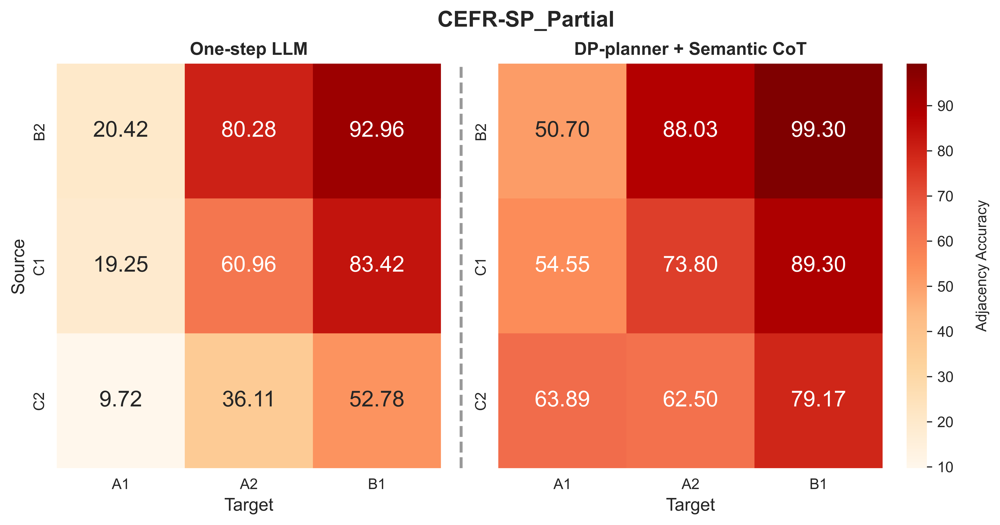

In [17]:
for lang in ["en"]:
    baseline = cefrsp_matrix_adjacc[f"{lang}_29"]
    agent_expert = cefrsp_matrix_adjacc[f"{lang}_48"]
    
    vmin = min(baseline.min(), agent_expert.min())
    vmax = max(baseline.max(), agent_expert.max())
    

    fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=1000, gridspec_kw={'width_ratios': [1, 1.25]})
    
    x_labels = ['A1', 'A2', 'B1']
    y_labels = ['B2', 'C1', 'C2']
    
    cmap = "OrRd"
    sns.heatmap(baseline, annot=True, ax=axes[0], cbar=False, cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[0].set_title('One-step LLM', fontsize = 12, fontweight='bold')
    axes[0].set_xlabel('Target', fontsize = 12)
    axes[0].set_ylabel('Source', fontsize = 12)
    
    heatmap = sns.heatmap(agent_expert, annot=True, ax=axes[1], cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[1].set_title('DP-planner + Semantic CoT', fontsize = 12, fontweight='bold')
    axes[1].set_xlabel('Target', fontsize = 12)
    # axes[1].set_ylabel('Source', fontsize = 12)
    

    cbar = heatmap.collections[0].colorbar

    cbar.set_label('Adjacency Accuracy', rotation=90, labelpad=15)
    
    fig.suptitle(f'CEFR-SP_Partial', fontsize=15, fontweight='bold')
    

    plt.subplots_adjust(wspace=10)  # 
    

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    

    ax0_pos = axes[0].get_position()
    ax1_pos = axes[1].get_position()
    x_line = (ax0_pos.x1 + ax1_pos.x0) / 2  # 
    y_start = ax0_pos.y0
    y_end = ax0_pos.y1
    
    line = lines.Line2D([x_line-0.008, x_line-0.008], [y_start, y_end], 
                       transform=fig.transFigure, color='#999999', linewidth=2.0, linestyle="--")
    fig.add_artist(line)
    
    plt.savefig(os.path.join(SAVEDIR, f"img/CEFR-SP/CEFR-SP_Partial_dp-cot_adjacc.jpg"), dpi = 1000, bbox_inches='tight')
    plt.savefig(os.path.join(SAVEDIR, f"img/CEFR-SP/CEFR-SP_Partial_dp-cot_adjacc.svg"), dpi = 1000, bbox_inches='tight', format="svg")
    plt.show()
    plt.close()

### Visual CEFR-SP Exact Accuracy Heatmap between Barayan et al., COLING2025. with ours agent+expert

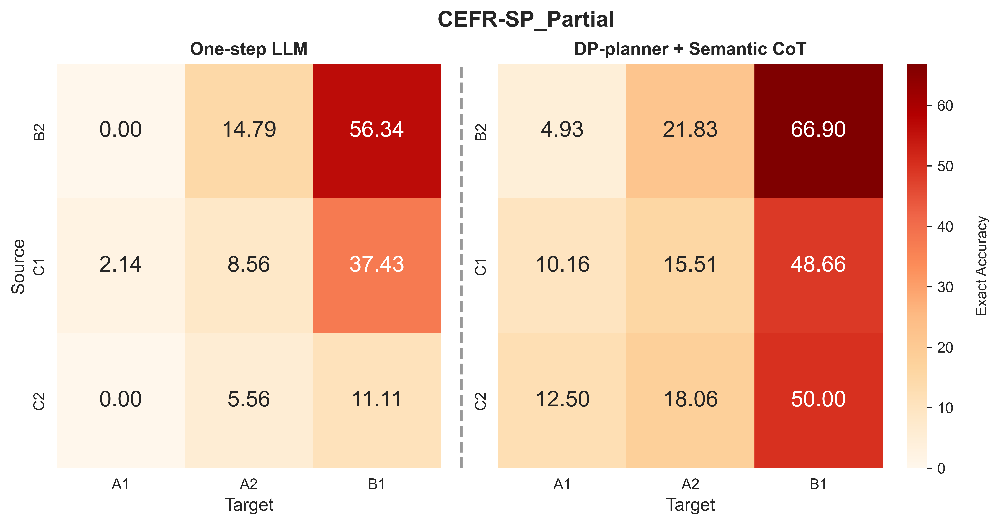

In [18]:
for lang in ["en"]:
    baseline = cefrsp_matrix_exaacc[f"{lang}_29"]
    agent_expert = cefrsp_matrix_exaacc[f"{lang}_48"]
    

    vmin = min(baseline.min(), agent_expert.min())
    vmax = max(baseline.max(), agent_expert.max())
    

    fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=1000, gridspec_kw={'width_ratios': [1, 1.25]})
    
    x_labels = ['A1', 'A2', 'B1']
    y_labels = ['B2', 'C1', 'C2']
    

    cmap = "OrRd"
    sns.heatmap(baseline, annot=True, ax=axes[0], cbar=False, cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[0].set_title('One-step LLM', fontsize = 12, fontweight='bold')
    axes[0].set_xlabel('Target', fontsize = 12)
    axes[0].set_ylabel('Source', fontsize = 12)
    

    heatmap = sns.heatmap(agent_expert, annot=True, ax=axes[1], cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[1].set_title('DP-planner + Semantic CoT', fontsize = 12, fontweight='bold')
    axes[1].set_xlabel('Target', fontsize = 12)
    # axes[1].set_ylabel('Source', fontsize = 12)
    

    cbar = heatmap.collections[0].colorbar

    cbar.set_label('Exact Accuracy', rotation=90, labelpad=15)
    
    fig.suptitle(f'CEFR-SP_Partial', fontsize=15, fontweight='bold')
    

    plt.subplots_adjust(wspace=10)  # 
    

    plt.tight_layout()

    plt.subplots_adjust(top=0.88)
    

    ax0_pos = axes[0].get_position()
    ax1_pos = axes[1].get_position()
    x_line = (ax0_pos.x1 + ax1_pos.x0) / 2  # 
    y_start = ax0_pos.y0
    y_end = ax0_pos.y1
    

    line = lines.Line2D([x_line-0.008, x_line-0.008], [y_start, y_end], 
                       transform=fig.transFigure, color='#999999', linewidth=2.0, linestyle="--")
    fig.add_artist(line)
    
    plt.savefig(os.path.join(SAVEDIR, f"img/CEFR-SP/CEFR-SP_Partial_dp-cot_exaacc.jpg"), dpi = 1000, bbox_inches='tight')
    plt.savefig(os.path.join(SAVEDIR, f"img/CEFR-SP/CEFR-SP_Partial_dp-cot_exaacc.svg"), dpi = 1000, bbox_inches='tight', format="svg")
    plt.show()
    plt.close()

In [11]:
cefrsp_whole_matrix_rmse = dict()
cefrsp_whole_matrix_adjacc = dict()
cefrsp_whole_matrix_exaacc = dict()

for expId in ["34", "49"]:  # 34 -> baseline; 49 -> dp+expert
    df_agent_expert = pd.read_csv(f"LLMGeneration/CEFR-SP/en_few-shot_{expId}.csv")
    label_all = [1 for _ in range(len(df_agent_expert))] + [2 for _ in range(len(df_agent_expert))] + [3 for _ in range(len(df_agent_expert))] 
    pred_all = df_agent_expert["pred_1"].tolist() + df_agent_expert["pred_2"].tolist() + df_agent_expert["pred_3"].tolist()
    correlation, p_value = spearmanr(label_all, pred_all)
    autometric_dict = {
        "Cor: ": round(correlation, 2),
        "p_value": round(p_value, 5),
        "AdjAcc": round(adjacency_accuracy(label_all, pred_all)*100, 2),
        "ExAcc": round(exact_accuracy(label_all, pred_all)*100, 2),
        "RMSE": round(calculate_rmse(label_all, pred_all), 2),
    }
    print(expId, autometric_dict)
    rmse_matrix, adjacc_matrix, exacc_matrix = [], [], []
    for source in [4, 5, 6]:
        tmp_rmse, tmp_adjacc, tmp_exacc = [], [], []
        df_ = df_agent_expert.loc[df_agent_expert["Rating"] == source]
        for target in [1, 2, 3]:
            pred_ = df_[f"pred_{target}"].tolist()
            label_ = [target for _ in range(len(pred_))]
            tmp_rmse.append(round(calculate_rmse(label_, pred_), 2))
            tmp_adjacc.append(round(adjacency_accuracy(label_, pred_)*100, 2))
            tmp_exacc.append(round(exact_accuracy(label_, pred_)*100, 2))
        rmse_matrix.append(tmp_rmse)
        adjacc_matrix.append(tmp_adjacc)
        exacc_matrix.append(tmp_exacc)
    cefrsp_whole_matrix_rmse[f"en_{expId}"] = np.array(rmse_matrix)
    cefrsp_whole_matrix_adjacc[f"en_{expId}"] = np.array(adjacc_matrix)
    cefrsp_whole_matrix_exaacc[f"en_{expId}"] = np.array(exacc_matrix)
    print(np.array(cefrsp_whole_matrix_rmse))
    print()

34 {'Cor: ': 0.24, 'p_value': 0.0, 'AdjAcc': 56.78, 'ExAcc': 18.54, 'RMSE': 1.71}
{'en_34': array([[2.  , 1.21, 0.78],
       [2.34, 1.58, 1.03],
       [2.91, 1.98, 1.63]])}

49 {'Cor: ': 0.36, 'p_value': 0.0, 'AdjAcc': 70.21, 'ExAcc': 27.06, 'RMSE': 1.38}
{'en_34': array([[2.  , 1.21, 0.78],
       [2.34, 1.58, 1.03],
       [2.91, 1.98, 1.63]]), 'en_49': array([[1.69, 0.99, 0.58],
       [1.91, 1.27, 0.85],
       [2.18, 1.56, 1.21]])}



### Visual, CEFR-SP-whole, RMSE

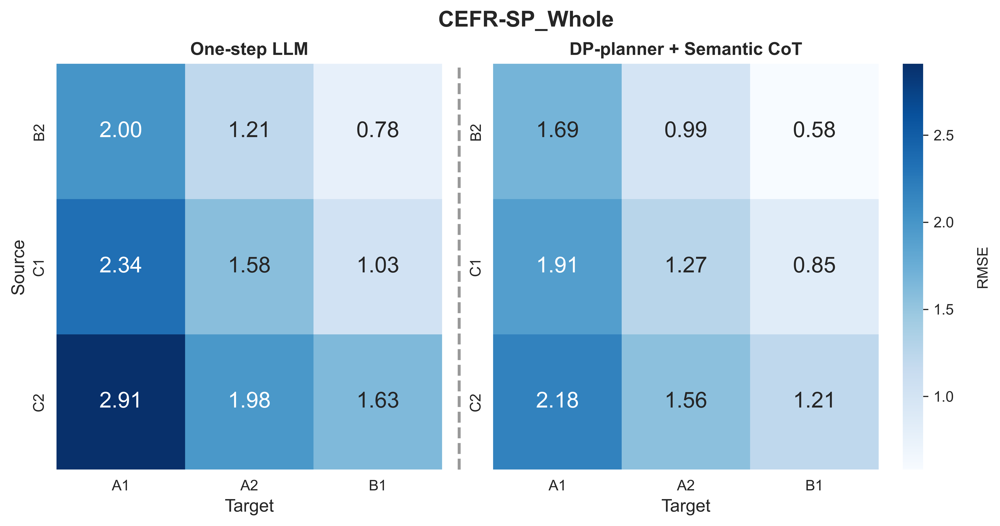

In [19]:
for lang in ["en"]:
    baseline = cefrsp_whole_matrix_rmse[f"{lang}_34"]
    agent_expert = cefrsp_whole_matrix_rmse[f"{lang}_49"]
    

    vmin = min(baseline.min(), agent_expert.min())
    vmax = max(baseline.max(), agent_expert.max())
    

    fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=600, gridspec_kw={'width_ratios': [1, 1.25]})
    
    x_labels = ['A1', 'A2', 'B1']
    y_labels = ['B2', 'C1', 'C2']
    

    cmap = "Blues"
    sns.heatmap(baseline, annot=True, ax=axes[0], cbar=False, cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[0].set_title('One-step LLM', fontsize = 12, fontweight='bold')
    axes[0].set_xlabel('Target', fontsize = 12)
    axes[0].set_ylabel('Source', fontsize = 12)
    

    heatmap = sns.heatmap(agent_expert, annot=True, ax=axes[1], cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[1].set_title('DP-planner + Semantic CoT', fontsize = 12, fontweight='bold')
    axes[1].set_xlabel('Target', fontsize = 12)
    # axes[1].set_ylabel('Source', fontsize = 12)
    

    cbar = heatmap.collections[0].colorbar

    cbar.set_label('RMSE', rotation=90, labelpad=15)
    
    fig.suptitle(f'CEFR-SP_Whole', fontsize=15, fontweight='bold')

    plt.subplots_adjust(wspace=10)  #
    

    plt.tight_layout()

    plt.subplots_adjust(top=0.88)
    

    ax0_pos = axes[0].get_position()
    ax1_pos = axes[1].get_position()
    x_line = (ax0_pos.x1 + ax1_pos.x0) / 2  # 
    y_start = ax0_pos.y0
    y_end = ax0_pos.y1
    

    line = lines.Line2D([x_line-0.008, x_line-0.008], [y_start, y_end], 
                       transform=fig.transFigure, color='#999999', linewidth=2.0, linestyle="--")
    fig.add_artist(line)
    
    plt.savefig(os.path.join(SAVEDIR, f"img/CEFR-SP/CEFR-SP_Whole_dp-cot_rmse.jpg"), dpi = 1000, bbox_inches='tight')
    plt.savefig(os.path.join(SAVEDIR, f"img/CEFR-SP/CEFR-SP_Whole_dp-cot_rmse.svg"), dpi = 1000, bbox_inches='tight', format="svg")
    plt.show()
    plt.close()

### Visual, CEFR-SP-whole, Adjacency Accuracy

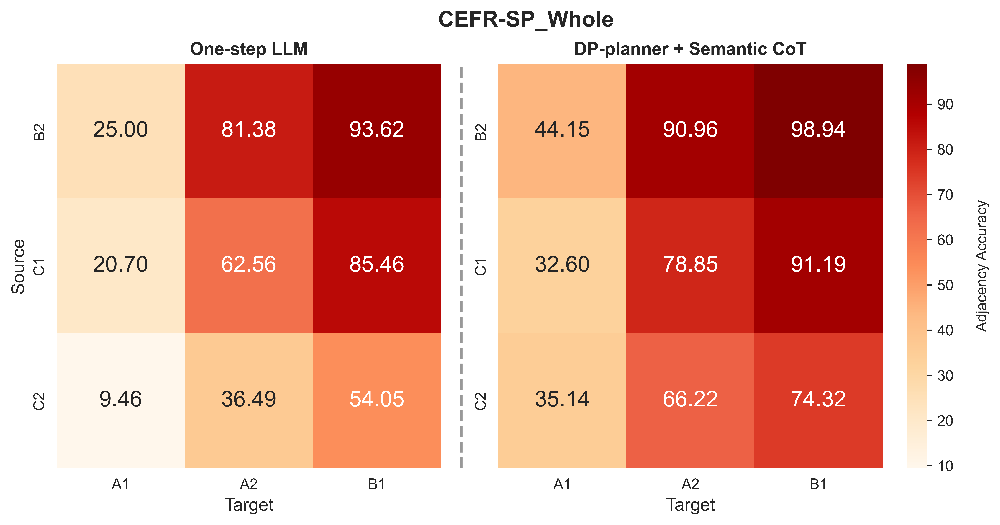

In [20]:
for lang in ["en"]:
    baseline = cefrsp_whole_matrix_adjacc[f"{lang}_34"]
    agent_expert = cefrsp_whole_matrix_adjacc[f"{lang}_49"]
    

    vmin = min(baseline.min(), agent_expert.min())
    vmax = max(baseline.max(), agent_expert.max())
    

    fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=1000, gridspec_kw={'width_ratios': [1, 1.25]})
    
    x_labels = ['A1', 'A2', 'B1']
    y_labels = ['B2', 'C1', 'C2']
    

    cmap = "OrRd"
    sns.heatmap(baseline, annot=True, ax=axes[0], cbar=False, cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[0].set_title('One-step LLM', fontsize = 12, fontweight='bold')
    axes[0].set_xlabel('Target', fontsize = 12)
    axes[0].set_ylabel('Source', fontsize = 12)

    heatmap = sns.heatmap(agent_expert, annot=True, ax=axes[1], cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[1].set_title('DP-planner + Semantic CoT', fontsize = 12, fontweight='bold')
    axes[1].set_xlabel('Target', fontsize = 12)
    # axes[1].set_ylabel('Source', fontsize = 12)
    

    cbar = heatmap.collections[0].colorbar

    cbar.set_label('Adjacency Accuracy', rotation=90, labelpad=15)
    
    fig.suptitle(f'CEFR-SP_Whole', fontsize=15, fontweight='bold')
    

    plt.subplots_adjust(wspace=10)  #
    

    plt.tight_layout()

    plt.subplots_adjust(top=0.88)
    

    ax0_pos = axes[0].get_position()
    ax1_pos = axes[1].get_position()
    x_line = (ax0_pos.x1 + ax1_pos.x0) / 2  #
    y_start = ax0_pos.y0
    y_end = ax0_pos.y1
    

    line = lines.Line2D([x_line-0.008, x_line-0.008], [y_start, y_end], 
                       transform=fig.transFigure, color='#999999', linewidth=2.0, linestyle="--")
    fig.add_artist(line)
    
    plt.savefig(os.path.join(SAVEDIR, f"img/CEFR-SP/CEFR-SP_Whole_dp-cot_adjacc.jpg"), dpi = 1000, bbox_inches='tight')
    plt.savefig(os.path.join(SAVEDIR, f"img/CEFR-SP/CEFR-SP_Whole_dp-cot_adjacc.svg"), dpi = 1000, bbox_inches='tight', format="svg")
    plt.show()
    plt.close()

### Visual, CEFR-SP-whole, Exact Accuracy

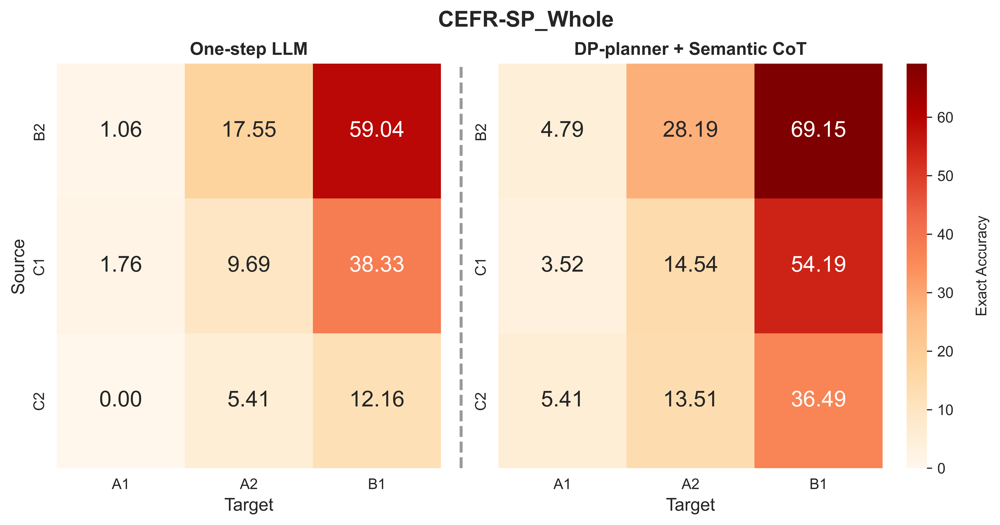

In [21]:
for lang in ["en"]:
    baseline = cefrsp_whole_matrix_exaacc[f"{lang}_34"]
    agent_expert = cefrsp_whole_matrix_exaacc[f"{lang}_49"]
    

    vmin = min(baseline.min(), agent_expert.min())
    vmax = max(baseline.max(), agent_expert.max())
    

    fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=1000, gridspec_kw={'width_ratios': [1, 1.25]})
    
    x_labels = ['A1', 'A2', 'B1']
    y_labels = ['B2', 'C1', 'C2']
    

    cmap = "OrRd"
    sns.heatmap(baseline, annot=True, ax=axes[0], cbar=False, cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[0].set_title('One-step LLM', fontsize = 12, fontweight='bold')
    axes[0].set_xlabel('Target', fontsize = 12)
    axes[0].set_ylabel('Source', fontsize = 12)
    

    heatmap = sns.heatmap(agent_expert, annot=True, ax=axes[1], cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[1].set_title('DP-planner + Semantic CoT', fontsize = 12, fontweight='bold')
    axes[1].set_xlabel('Target', fontsize = 12)
    # axes[1].set_ylabel('Source', fontsize = 12)
    

    cbar = heatmap.collections[0].colorbar

    cbar.set_label('Exact Accuracy', rotation=90, labelpad=15)
    
    fig.suptitle(f'CEFR-SP_Whole', fontsize=15, fontweight='bold')
    

    plt.subplots_adjust(wspace=10)  # 
    

    plt.tight_layout()

    plt.subplots_adjust(top=0.88)
    

    ax0_pos = axes[0].get_position()
    ax1_pos = axes[1].get_position()
    x_line = (ax0_pos.x1 + ax1_pos.x0) / 2  # 
    y_start = ax0_pos.y0
    y_end = ax0_pos.y1
    

    line = lines.Line2D([x_line-0.008, x_line-0.008], [y_start, y_end], 
                       transform=fig.transFigure, color='#999999', linewidth=2.0, linestyle="--")
    fig.add_artist(line)
    
    plt.savefig(os.path.join(SAVEDIR, f"img/CEFR-SP/CEFR-SP_Whole_dp-cot_exaacc.jpg"), dpi = 1000, bbox_inches='tight')
    plt.savefig(os.path.join(SAVEDIR, f"img/CEFR-SP/CEFR-SP_Whole_dp-cot_exaacc.svg"), dpi = 1000, bbox_inches='tight', format="svg")
    plt.show()
    plt.close()

### README, Agent + Expert
### Auto-evaluation

In [5]:
rmse_matrix_dict = dict()
adjacc_matrix_dict = dict()
exacc_matrix_dict = dict()

In [7]:
expId = "47"
for lang in ["ar", "en", "fr", "hi", "ru"]:
    df_agent_expert = pd.read_csv(f"LLMGeneration/README/{lang}/{lang}_few-shot_{expId}.csv")
    label_all = [1 for _ in range(len(df_agent_expert))] + [2 for _ in range(len(df_agent_expert))] + [3 for _ in range(len(df_agent_expert))] 
    pred_all = df_agent_expert["pred_1"].tolist() + df_agent_expert["pred_2"].tolist() + df_agent_expert["pred_3"].tolist()
    correlation, p_value = spearmanr(label_all, pred_all)
    autometric_dict = {
        "Cor: ": round(correlation, 2),
        "p_value": round(p_value, 5),
        "AdjAcc": round(adjacency_accuracy(label_all, pred_all)*100, 2),
        "ExAcc": round(exact_accuracy(label_all, pred_all)*100, 2),
        "RMSE": round(calculate_rmse(label_all, pred_all), 2),
    }
    print(lang, autometric_dict)
    rmse_matrix, adjacc_matrix, exacc_matrix = [], [], []
    for source in [4, 5, 6]:
        tmp_rmse, tmp_adjacc, tmp_exacc = [], [], []
        df_ = df_agent_expert.loc[df_agent_expert["Rating"] == source]
        for target in [1, 2, 3]:
            pred_ = df_[f"pred_{target}"].tolist()
            label_ = [target for _ in range(len(pred_))]
            tmp_rmse.append(round(calculate_rmse(label_, pred_), 2))
            tmp_adjacc.append(round(adjacency_accuracy(label_, pred_)*100, 2))
            tmp_exacc.append(round(exact_accuracy(label_, pred_)*100, 2))
        rmse_matrix.append(tmp_rmse)
        adjacc_matrix.append(tmp_adjacc)
        exacc_matrix.append(tmp_exacc)
    rmse_matrix_dict[f"{lang}_{expId}"] = np.array(rmse_matrix)
    adjacc_matrix_dict[f"{lang}_{expId}"] = np.array(adjacc_matrix)
    exacc_matrix_dict[f"{lang}_{expId}"] = np.array(exacc_matrix)
    print(np.array(adjacc_matrix))
    print()

ar {'Cor: ': 0.35, 'p_value': 0.0, 'AdjAcc': 70.47, 'ExAcc': 23.98, 'RMSE': 1.4}
[[36.76 89.71 91.18]
 [21.43 67.86 89.29]
 [72.22 77.78 88.89]]

en {'Cor: ': 0.34, 'p_value': 0.0, 'AdjAcc': 86.36, 'ExAcc': 33.84, 'RMSE': 1.07}
[[ 71.74  97.83 100.  ]
 [ 50.    94.12 100.  ]
 [ 50.    50.    83.33]]

fr {'Cor: ': 0.5, 'p_value': 0.0, 'AdjAcc': 82.94, 'ExAcc': 33.33, 'RMSE': 1.1}
[[ 63.04 100.   100.  ]
 [ 42.31  96.15  96.15]
 [ 41.67  91.67  91.67]]

hi {'Cor: ': 0.31, 'p_value': 0.0, 'AdjAcc': 62.67, 'ExAcc': 20.89, 'RMSE': 1.85}
[[62.5  78.12 87.5 ]
 [46.67 50.   70.  ]
 [30.77 46.15 61.54]]

ru {'Cor: ': 0.52, 'p_value': 0.0, 'AdjAcc': 89.95, 'ExAcc': 42.33, 'RMSE': 0.94}
[[ 82.35  97.06  97.06]
 [ 71.43  90.48 100.  ]
 [ 87.5   87.5   87.5 ]]



In [15]:
# rmse_matrix_dict
# adjacc_matrix_dict
exacc_matrix_dict

{'ar_baseline': array([[ 0.  , 19.12, 60.29],
        [ 0.  ,  3.57, 32.14],
        [ 0.  , 38.89, 38.89]]),
 'en_baseline': array([[ 3.26, 42.39, 57.61],
        [ 2.94, 23.53, 58.82],
        [ 0.  ,  0.  , 16.67]]),
 'fr_baseline': array([[ 0.  , 13.04, 78.26],
        [ 0.  ,  7.69, 61.54],
        [ 0.  ,  0.  , 41.67]]),
 'hi_baseline': array([[12.5 , 28.12, 21.88],
        [ 3.33, 16.67, 20.  ],
        [ 0.  ,  7.69,  7.69]]),
 'ru_baseline': array([[41.18, 64.71, 50.  ],
        [19.05, 28.57, 47.62],
        [12.5 , 25.  , 62.5 ]])}

### Visual README RMSE Heatmap between COLING2025 with ours agent+expert

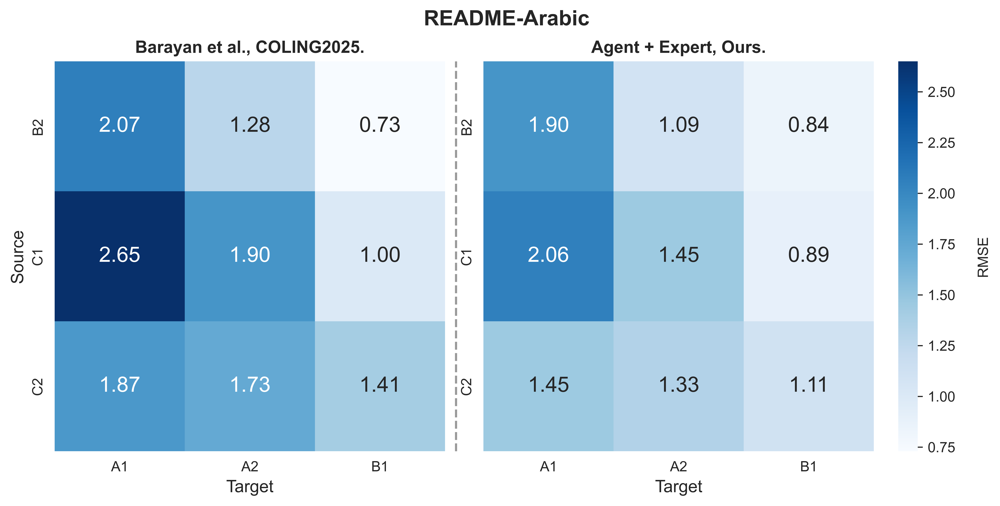

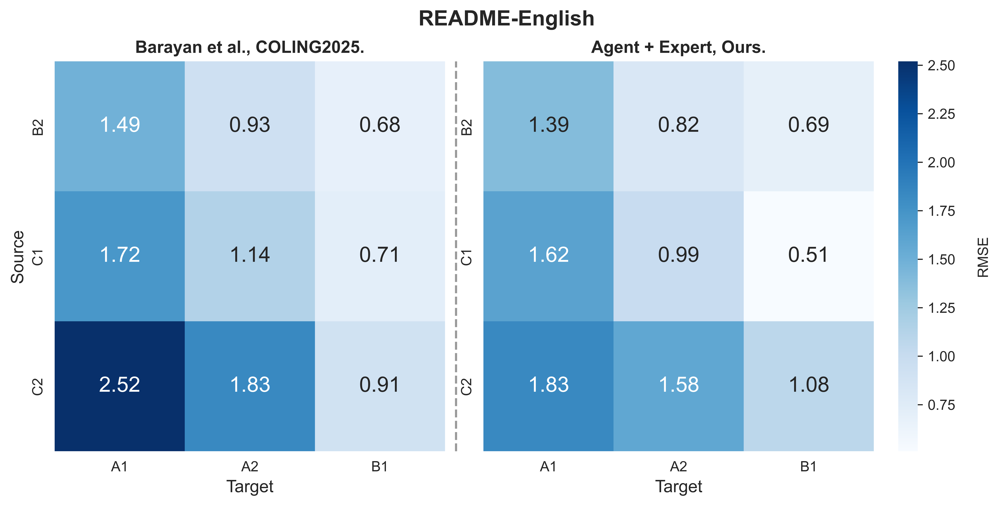

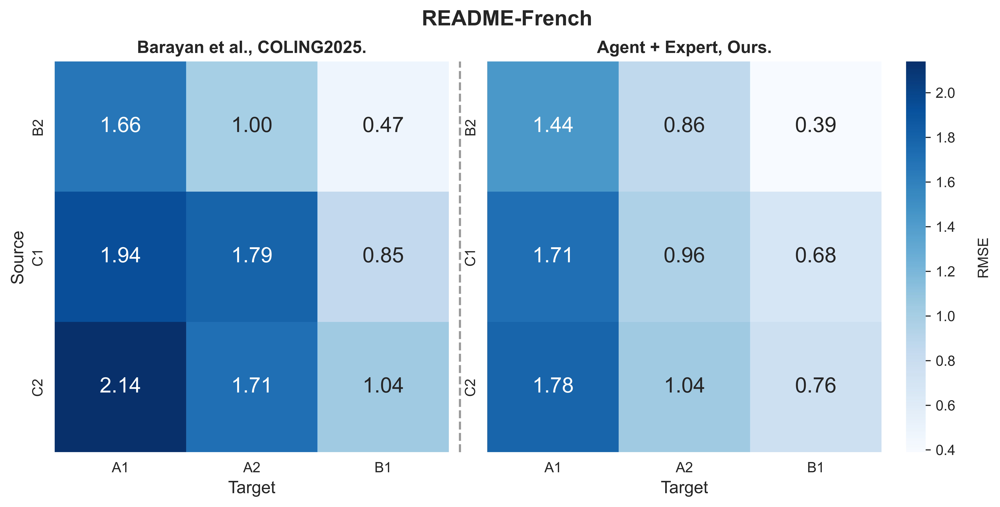

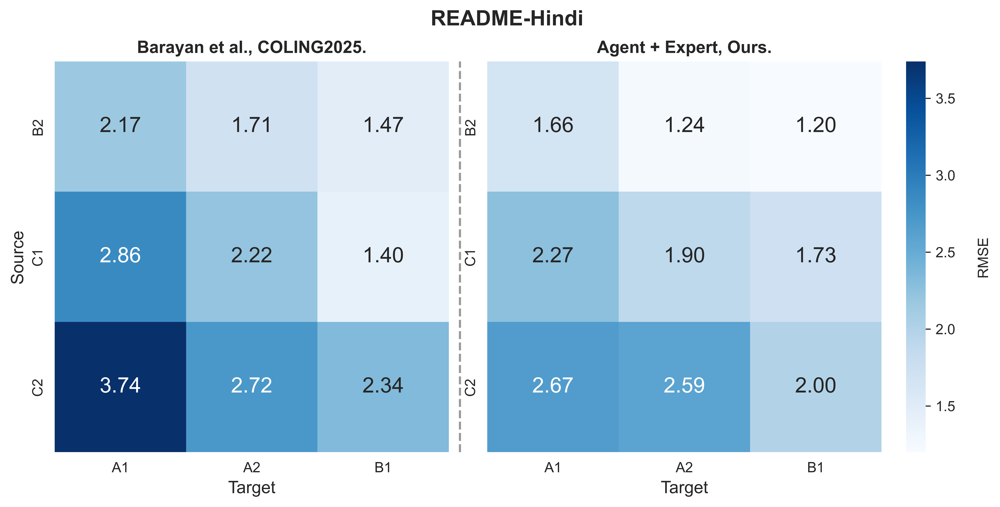

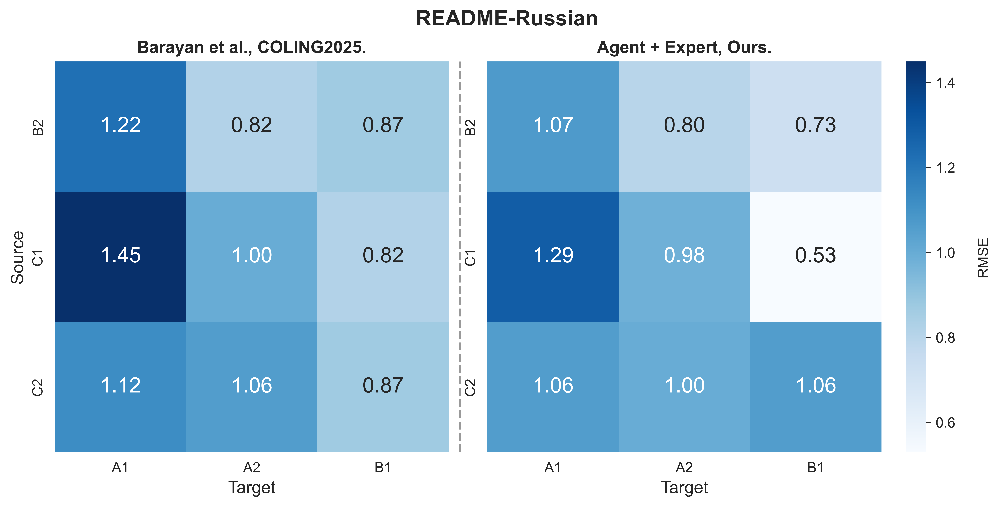

36492

In [9]:
lang2desc = {
    "ar": "Arabic", "en": "English", "fr": "French", "hi": "Hindi", "ru": "Russian"
}
for lang in ["ar", "en", "fr", "hi", "ru"]:
    baseline = rmse_matrix_dict[f"{lang}_baseline"]
    agent_expert = rmse_matrix_dict[f"{lang}_47"]
    

    vmin = min(baseline.min(), agent_expert.min())
    vmax = max(baseline.max(), agent_expert.max())
    

    fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=1000, gridspec_kw={'width_ratios': [1, 1.25]})
    
    x_labels = ['A1', 'A2', 'B1']
    y_labels = ['B2', 'C1', 'C2']
    

    cmap = "Blues"
    sns.heatmap(baseline, annot=True, ax=axes[0], cbar=False, cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[0].set_title('Barayan et al., COLING2025.', fontsize = 12, fontweight='bold')
    axes[0].set_xlabel('Target', fontsize = 12)
    axes[0].set_ylabel('Source', fontsize = 12)
    

    heatmap = sns.heatmap(agent_expert, annot=True, ax=axes[1], cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[1].set_title('Agent + Expert, Ours.', fontsize = 12, fontweight='bold')
    axes[1].set_xlabel('Target', fontsize = 12)
    # axes[1].set_ylabel('Source', fontsize = 12)
    

    cbar = heatmap.collections[0].colorbar

    cbar.set_label('RMSE', rotation=90, labelpad=15)
    

    fig.suptitle(f'README-{lang2desc[lang]}', fontsize=15, fontweight='bold')
    

    plt.tight_layout()

    plt.subplots_adjust(top=0.88)
    

    ax0_pos = axes[0].get_position()
    ax1_pos = axes[1].get_position()
    x_line = (ax0_pos.x1 + ax1_pos.x0) / 2  # 
    y_start = ax0_pos.y0
    y_end = ax0_pos.y1
    

    line = lines.Line2D([x_line-0.008, x_line-0.008], [y_start, y_end], 
                       transform=fig.transFigure, color='#999999', linewidth=1.5, linestyle="--")
    fig.add_artist(line)
    
    plt.savefig(os.path.join(SAVEDIR, f"img/README/{lang}/README-{lang}_dp-cot_rmse.jpg"), dpi = 1000, bbox_inches='tight')
    plt.savefig(os.path.join(SAVEDIR, f"img/README/{lang}/README-{lang}_dp-cot_rmse.svg"), dpi = 1000, bbox_inches='tight', format='svg')
    plt.show()
    plt.close()

del fig 
gc.collect()

### Visual README Adjacency Heatmap between COLING2025 with ours agent+expert

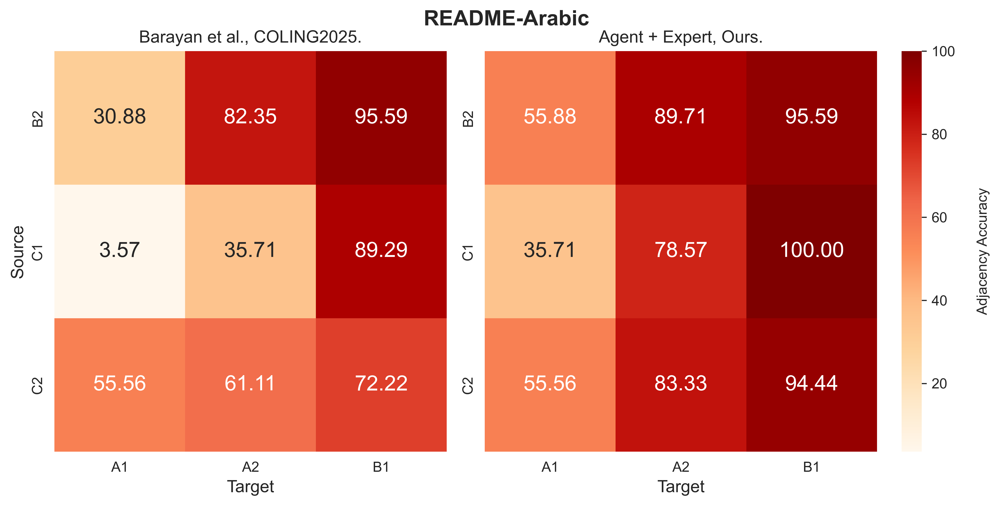

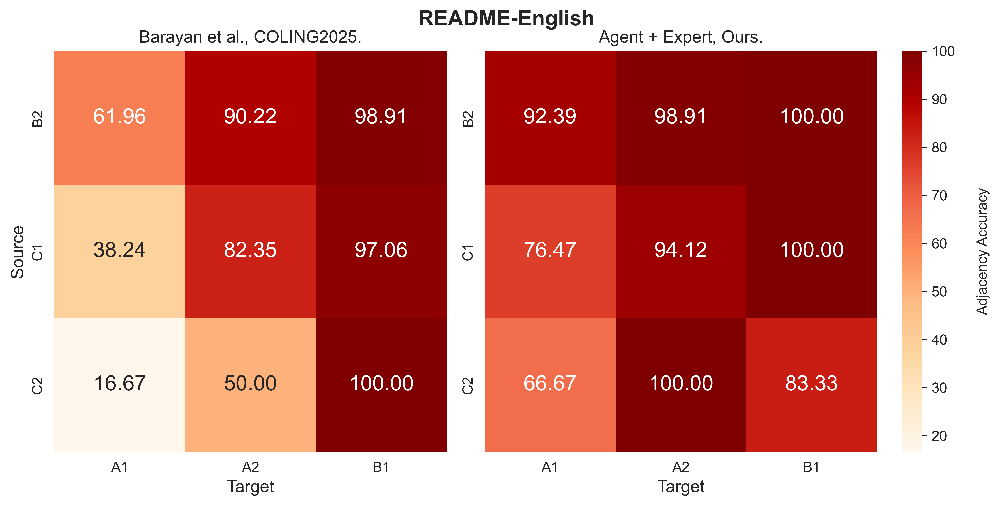

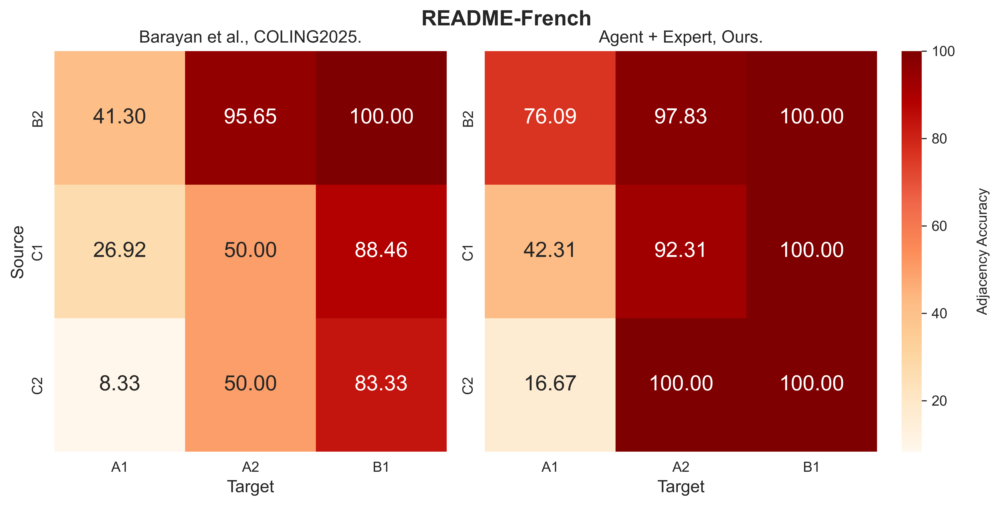

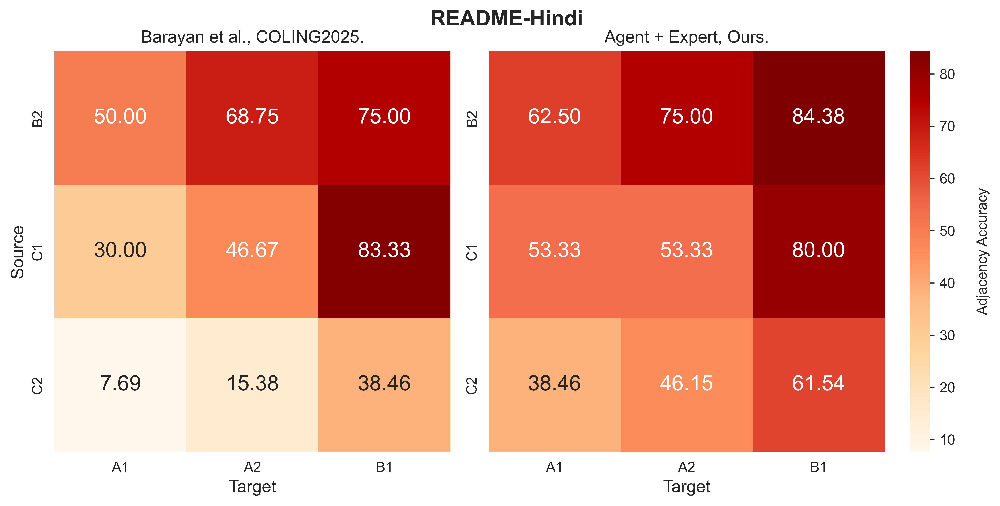

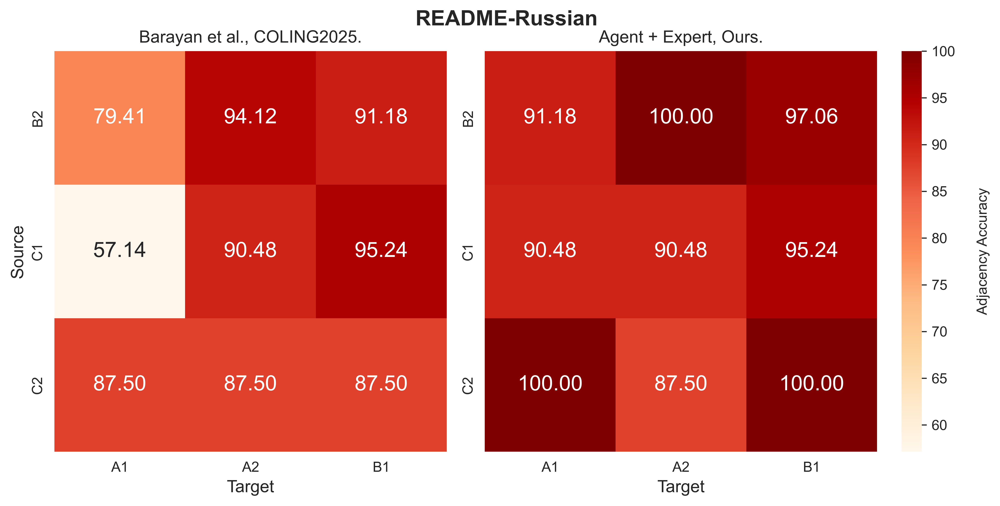

In [78]:
lang2desc = {
    "ar": "Arabic", "en": "English", "fr": "French", "hi": "Hindi", "ru": "Russian"
}
for lang in ["ar", "en", "fr", "hi", "ru"]:
    baseline = adjacc_matrix_dict[f"{lang}_baseline"]
    
    agent_expert = adjacc_matrix_dict[f"{lang}_17"]
    

    vmin = min(baseline.min(), agent_expert.min())
    vmax = max(baseline.max(), agent_expert.max())

    fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=600, gridspec_kw={'width_ratios': [1, 1.25]})
    
    x_labels = ['A1', 'A2', 'B1']
    y_labels = ['B2', 'C1', 'C2']

    cmap = "OrRd"
    sns.heatmap(baseline, annot=True, ax=axes[0], cbar=False, cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[0].set_title('Barayan et al., COLING2025.', fontsize = 12)
    axes[0].set_xlabel('Target', fontsize = 12)
    axes[0].set_ylabel('Source', fontsize = 12)
    

    heatmap = sns.heatmap(agent_expert, annot=True, ax=axes[1], cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[1].set_title('Agent + Expert, Ours.', fontsize = 12)
    axes[1].set_xlabel('Target', fontsize = 12)
    # axes[1].set_ylabel('Source', fontsize = 12)
    

    cbar = heatmap.collections[0].colorbar

    cbar.set_label('Adjacency Accuracy', rotation=90, labelpad=15)
    

    fig.suptitle(f'README-{lang2desc[lang]}', fontsize=15, fontweight='bold')
    

    plt.tight_layout()

    plt.subplots_adjust(top=0.9)
    plt.savefig(os.path.join(SAVEDIR, f"img/README/{lang}/README-{lang}_agent-expert_adjacc_{cmap}.jpg"), dpi = 1000, bbox_inches='tight')
    plt.show()
    plt.close()

### Visual README Exact Heatmap between COLING2025 with ours agent+expert

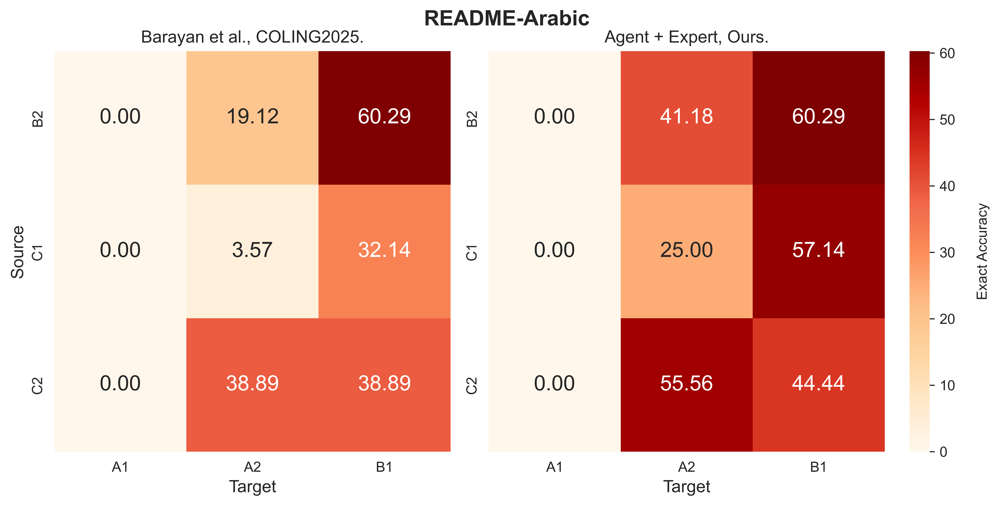

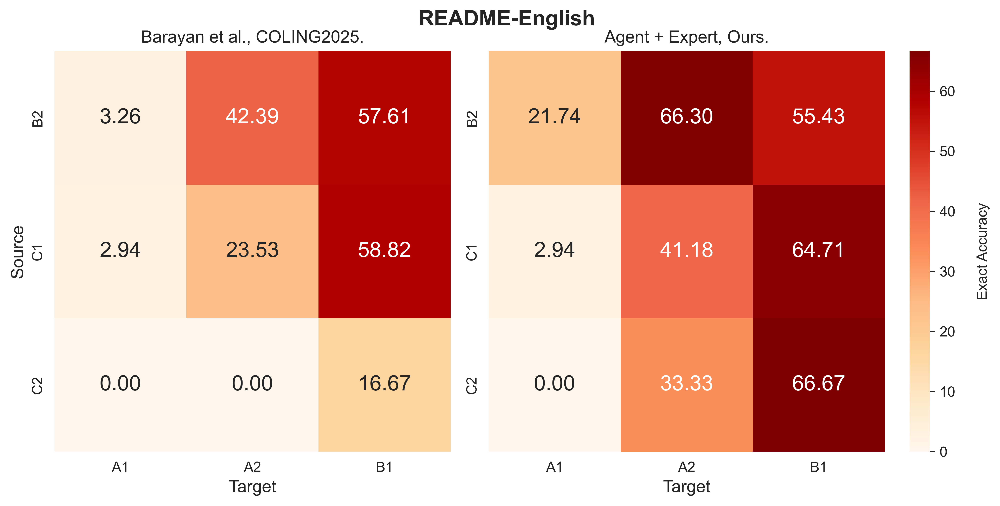

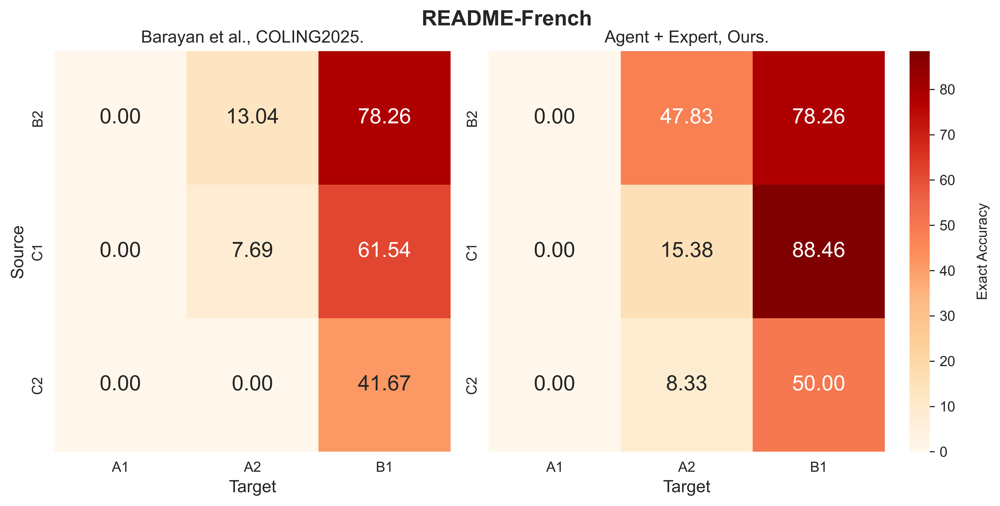

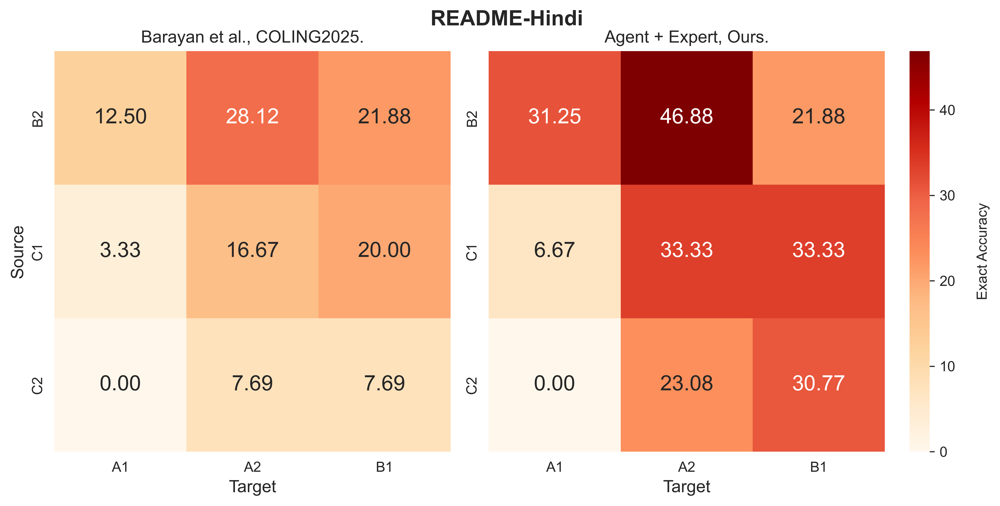

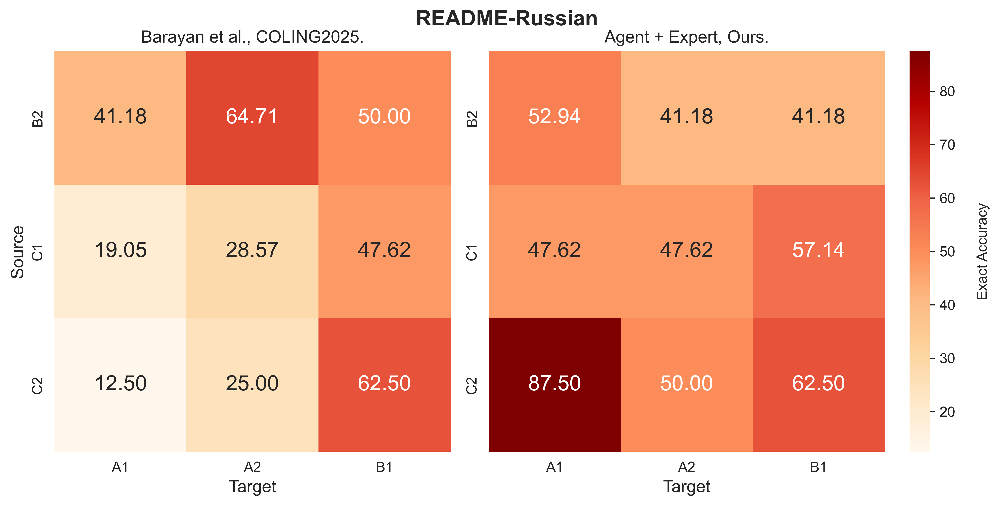

In [79]:
lang2desc = {
    "ar": "Arabic", "en": "English", "fr": "French", "hi": "Hindi", "ru": "Russian"
}
for lang in ["ar", "en", "fr", "hi", "ru"]:
    baseline = exacc_matrix_dict[f"{lang}_baseline"]
    
    agent_expert = exacc_matrix_dict[f"{lang}_17"]
    

    vmin = min(baseline.min(), agent_expert.min())
    vmax = max(baseline.max(), agent_expert.max())
    

    fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=600, gridspec_kw={'width_ratios': [1, 1.25]})
    
    x_labels = ['A1', 'A2', 'B1']
    y_labels = ['B2', 'C1', 'C2']
    

    cmap = "OrRd"
    sns.heatmap(baseline, annot=True, ax=axes[0], cbar=False, cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[0].set_title('Barayan et al., COLING2025.', fontsize = 12)
    axes[0].set_xlabel('Target', fontsize = 12)
    axes[0].set_ylabel('Source', fontsize = 12)
    

    heatmap = sns.heatmap(agent_expert, annot=True, ax=axes[1], cmap = cmap, xticklabels=x_labels, yticklabels=y_labels, vmin=vmin, vmax=vmax, annot_kws={'size': 15}, fmt='.2f')
    axes[1].set_title('Agent + Expert, Ours.', fontsize = 12)
    axes[1].set_xlabel('Target', fontsize = 12)
    # axes[1].set_ylabel('Source', fontsize = 12)
    

    cbar = heatmap.collections[0].colorbar

    cbar.set_label('Exact Accuracy', rotation=90, labelpad=15)
    

    fig.suptitle(f'README-{lang2desc[lang]}', fontsize=15, fontweight='bold')
    

    plt.tight_layout()

    plt.subplots_adjust(top=0.9)
    plt.savefig(os.path.join(SAVEDIR, f"img/README/{lang}/README-{lang}_agent-expert_exaacc_{cmap}.jpg"), dpi = 1000, bbox_inches='tight')
    plt.show()
    plt.close()